In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

In [2]:
warnings.filterwarnings('ignore')

In [3]:
agri=pd.read_csv(r"C:\Users\shubh\Downloads\archive (4)\data_core_updated.csv")
agri

,Temperature,Humidity,Soil Moisture,Soil Type,Crop Type,Nitrogen,Potassium,Phosphorus,Fertilizer
0,29.89,69.58,27.33,Sandy Loam,Arhar/Tur,17.47,24.59,32.87,MOP
1,25.85,56.63,22.71,Sandy Loam,Arhar/Tur,3.76,17.32,27.77,20-40-20
2,25.30,50.72,22.73,Loamy,Arhar/Tur,4.48,18.11,28.25,20-40-20
3,29.45,46.51,41.87,Loamy,Arhar/Tur,4.85,12.62,43.49,MOP
4,16.02,56.99,48.91,Sand,Arhar/Tur,11.54,31.36,27.20,DAP
...,...,...,...,...,...,...,...,...,...
8995,23.23,63.40,23.19,Sandy Loam,Wheat,116.28,37.17,37.51,MOP
8996,11.03,45.37,16.94,Clay Loam,Wheat,63.40,21.28,23.35,20-10-10
8997,18.84,61.50,20.55,Loamy,Wheat,88.88,30.37,34.17,DAP
8998,18.71,56.30,20.69,Clay Loam,Wheat,87.01,30.95,31.55,DAP


In [4]:
agri.isnull().sum()

Temperature      0
Humidity         0
Soil Moisture    0
Soil Type        0
Crop Type        0
Nitrogen         0
Potassium        0
Phosphorus       0
Fertilizer       0
dtype: int64

In [5]:
agri.isnull().sum()

Temperature      0
Humidity         0
Soil Moisture    0
Soil Type        0
Crop Type        0
Nitrogen         0
Potassium        0
Phosphorus       0
Fertilizer       0
dtype: int64

In [6]:
for i in agri.columns:
    print(i,':','\n',agri[i].unique(),'\n')

Temperature : 
 [29.89 25.85 25.3  ... 12.32 23.42 22.  ] 

Humidity : 
 [69.58 56.63 50.72 ... 63.4  56.3  81.48] 

Soil Moisture : 
 [27.33 22.71 22.73 ... 29.09 47.96 36.9 ] 

Soil Type : 
 ['Sandy Loam' 'Loamy' 'Sand' 'Clay Loam' 'Clay' 'Sandy' 'Loamy Sand'
 'Loam' 'Red Clay Loam' 'Red Loam' 'Silty Loam' 'Alluvial' 'Black Soil'] 

Crop Type : 
 ['Arhar/Tur' 'Bajra' 'Barley' 'Coriander' 'Cotton (Lint)' 'Cowpea (Lobia)'
 'Dry Chillies' 'Garlic' 'Ginger' 'Gram (Chickpea)' 'Groundnut' 'Jowar'
 'Linseed (Flax)' 'Maize (Grain)' 'Maize (Fodder)' 'Masoor (Red Lentil)'
 'Moong (Green Gram)' 'Onion' 'Peas & Beans (Pulses)' 'Potato'
 'Ragi (Finger Millet)' 'Rapeseed & Mustard' 'Rice' 'Safflower'
 'Sugarcane' 'Sunflower' 'Turmeric' 'Urad (Black Gram)' 'Urad Bean'
 'Wheat'] 

Nitrogen : 
 [17.47  3.76  4.48 ... 63.4  88.88 87.01] 

Potassium : 
 [24.59 17.32 18.11 ... 30.84 37.17  7.53] 

Phosphorus : 
 [32.87 27.77 28.25 ... 34.82 35.96 36.67] 

Fertilizer : 
 ['MOP' '20-40-20' 'DAP' 'Urea' '4

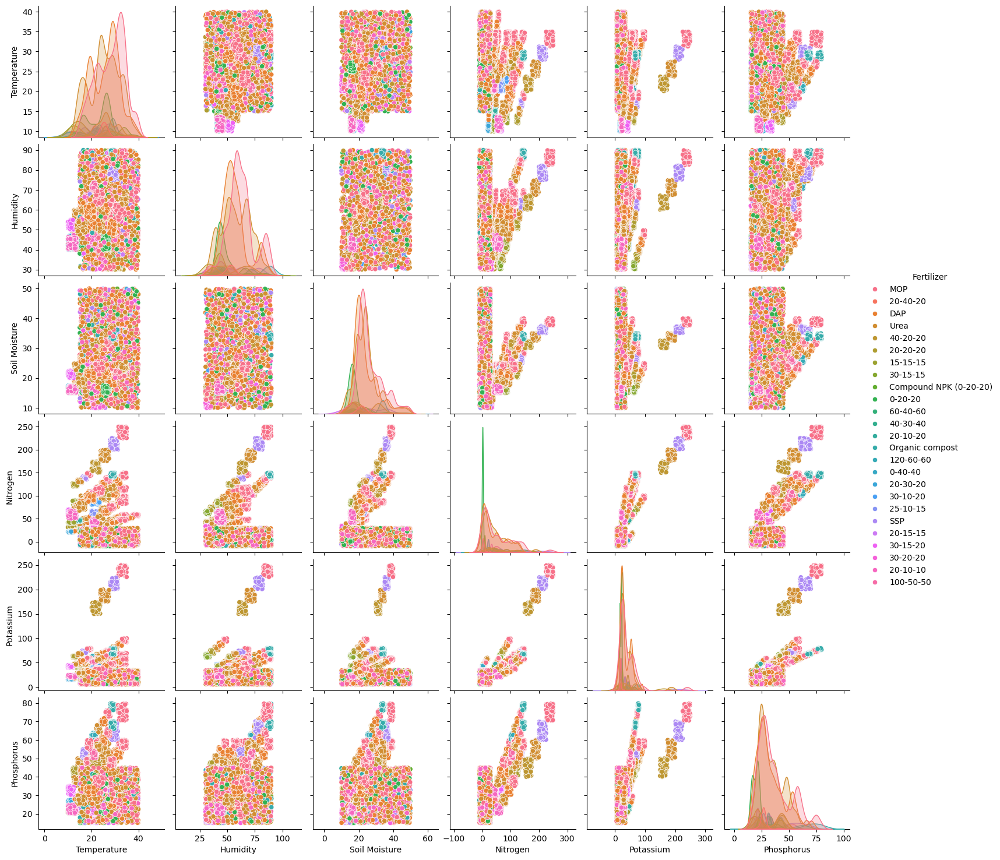

In [7]:
sns.pairplot(agri,hue ='Fertilizer') 
plt.show()

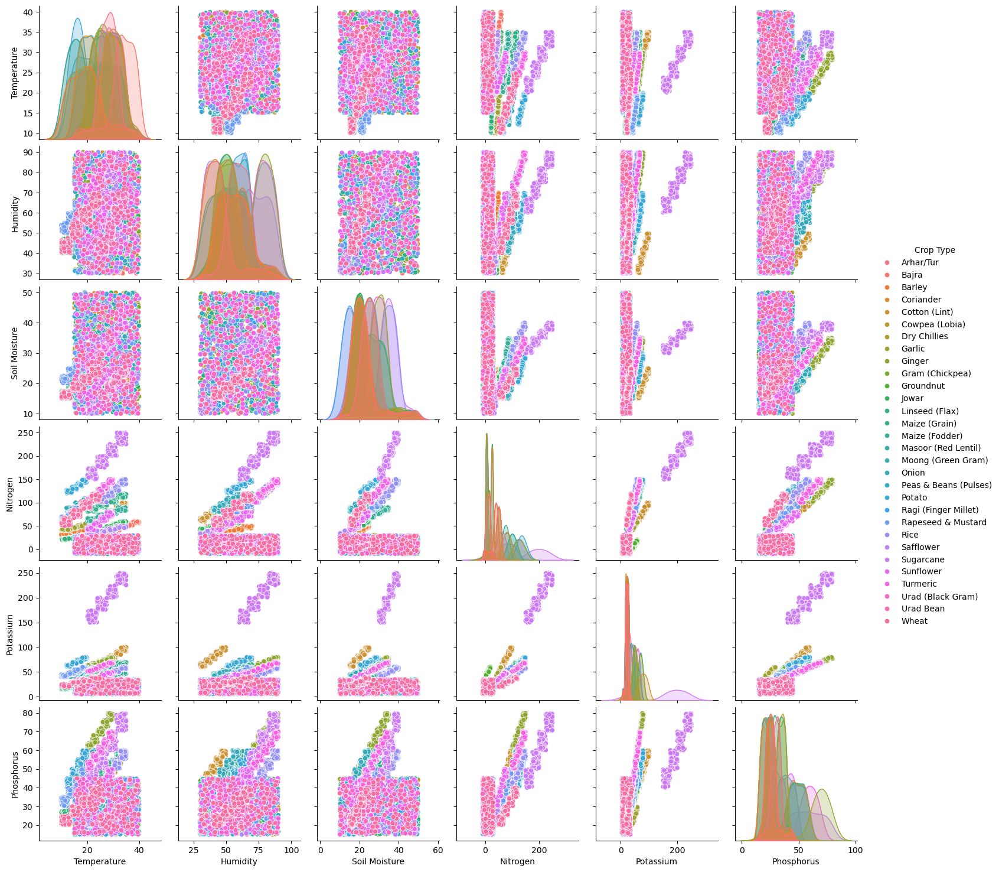

In [8]:
sns.pairplot(agri,hue ='Crop Type') 
plt.show()

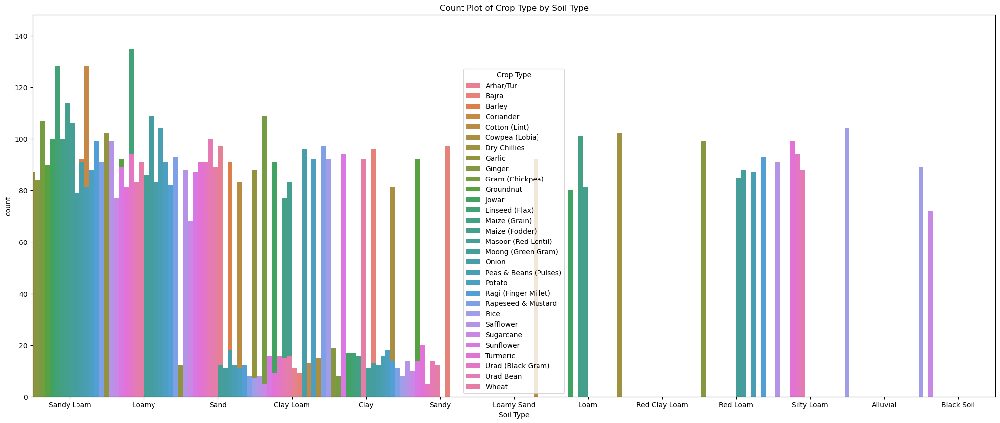

In [9]:
plt.figure(figsize=(25, 10))
sns.countplot(data=agri, x='Soil Type', hue='Crop Type',width=2)
plt.title('Count Plot of Crop Type by Soil Type')
plt.show()


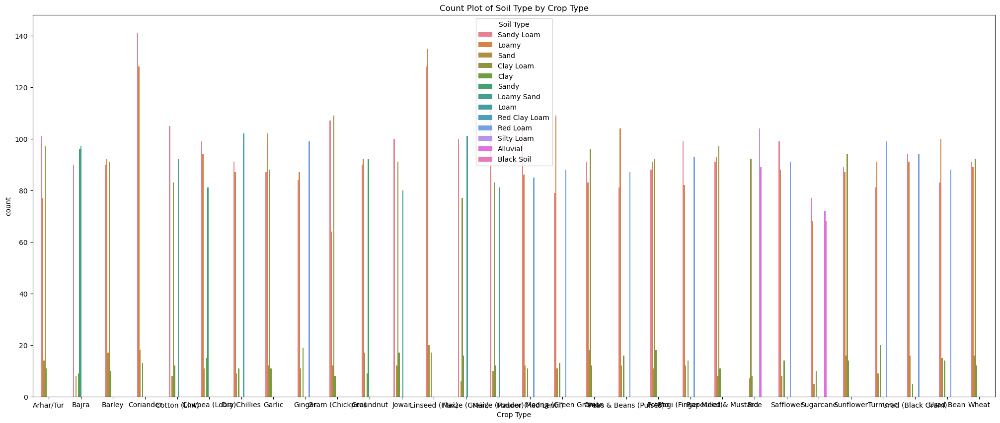

In [10]:
plt.figure(figsize=(25, 10))
sns.countplot(data=agri, x='Crop Type', hue='Soil Type',width=0.5)
plt.title('Count Plot of Soil Type by Crop Type')
plt.show()


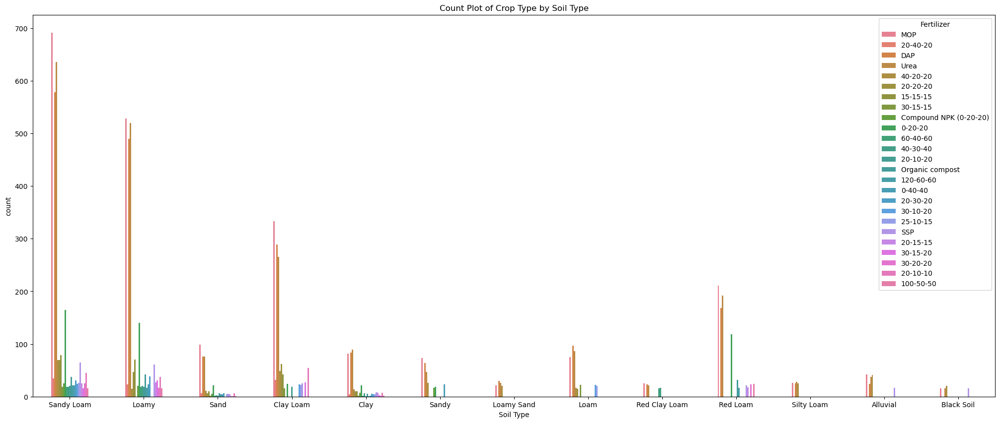

In [11]:
plt.figure(figsize=(25, 10))
sns.countplot(data=agri, x='Soil Type', hue='Fertilizer',width=0.5)
plt.title('Count Plot of Crop Type by Soil Type')
plt.show()


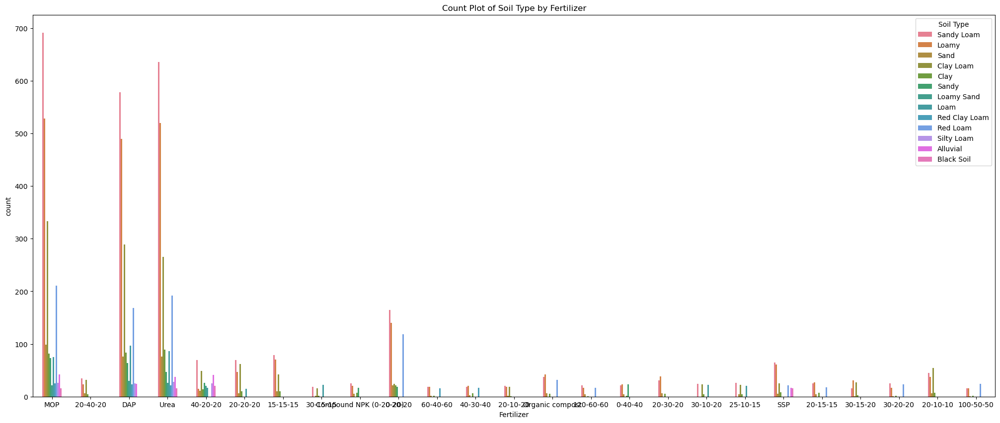

In [12]:
plt.figure(figsize=(25, 10))
sns.countplot(data=agri, x='Fertilizer', hue='Soil Type',width=0.5)
plt.title('Count Plot of Soil Type by Fertilizer')
plt.show()


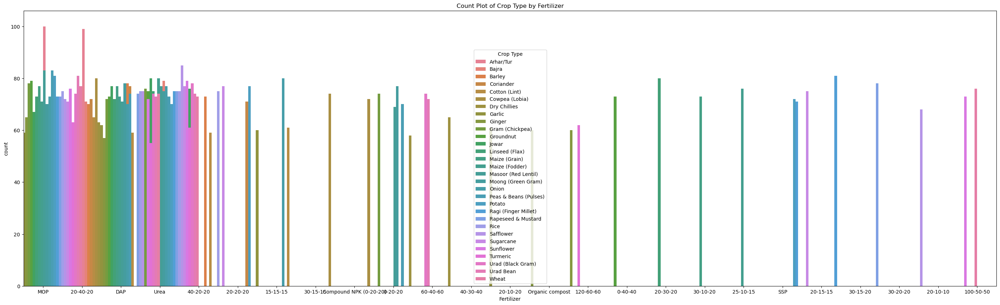

In [13]:
plt.figure(figsize=(35, 10))
sns.countplot(data=agri, x='Fertilizer', hue='Crop Type',width=2)
plt.title('Count Plot of Crop Type by Fertilizer')
plt.show()


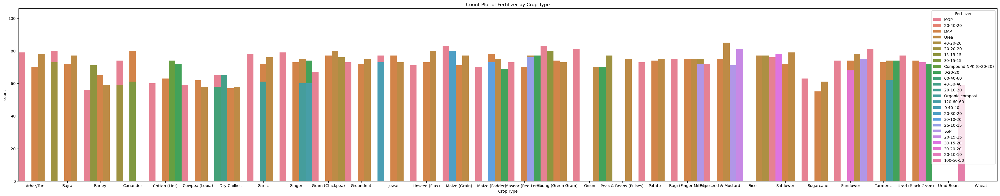

In [14]:
plt.figure(figsize=(45, 8))
sns.countplot(data=agri, x='Crop Type', hue='Fertilizer',width=5)
plt.title('Count Plot of Fertilizer by Crop Type')
plt.show()


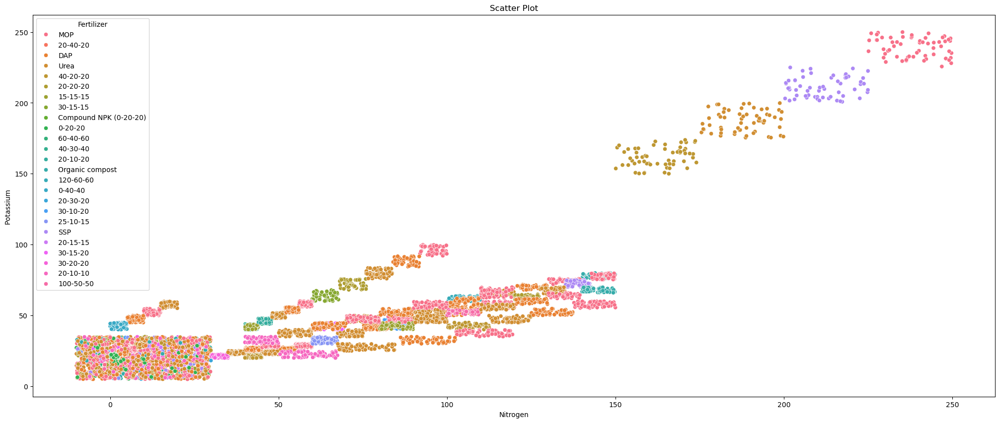

In [15]:
plt.figure(figsize=(25, 10))
sns.scatterplot(data=agri,x='Nitrogen',y='Potassium',hue='Fertilizer')
plt.title('Scatter Plot')
plt.xlabel('Nitrogen')
plt.ylabel('Potassium ')
plt.show()

In [16]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Nutrient features
nutrient_features = ['Nitrogen', 'Phosphorus', 'Potassium']
X_nutrients = agri[nutrient_features]

# Standardize
scaler = StandardScaler()
X_nutrients_scaled = scaler.fit_transform(X_nutrients)

# PCA
pca_nutrients = PCA(n_components=2)
nutrients_pca = pca_nutrients.fit_transform(X_nutrients_scaled)

# Combine with fertilizer
nutrient_df = pd.DataFrame(nutrients_pca, columns=['PC1', 'PC2'])
nutrient_df['Fertilizer'] = agri['Fertilizer']


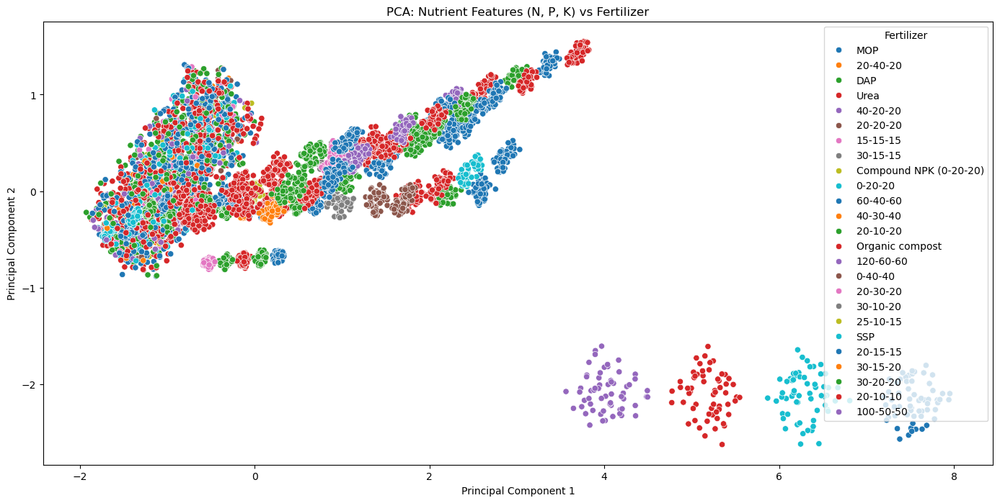

In [17]:
plt.figure(figsize=(17, 8))
sns.scatterplot(data=nutrient_df, x='PC1', y='PC2', hue='Fertilizer', palette='tab10')
plt.title('PCA: Nutrient Features (N, P, K) vs Fertilizer')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


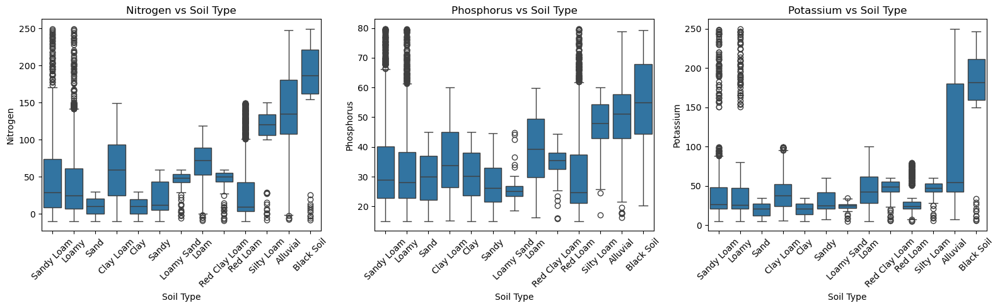

In [18]:
plt.figure(figsize=(16, 5))
for i, col in enumerate(['Nitrogen', 'Phosphorus', 'Potassium']):
    plt.subplot(1, 3, i+1)
    sns.boxplot(data=agri, x='Soil Type', y=col)
    plt.title(f'{col} vs Soil Type')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

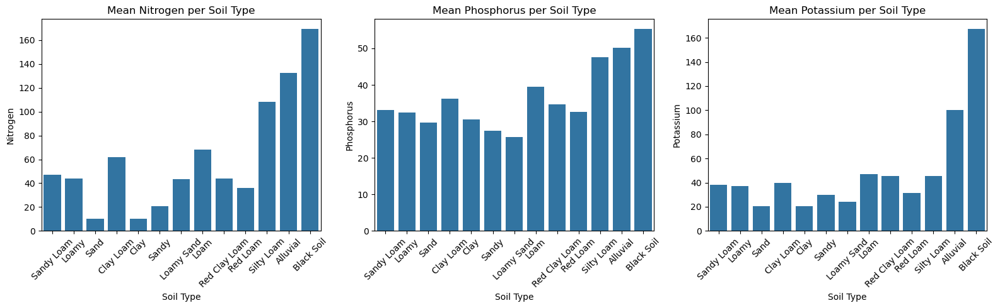

In [19]:
plt.figure(figsize=(16, 5))
for i, col in enumerate(['Nitrogen', 'Phosphorus', 'Potassium']):
    plt.subplot(1, 3, i+1)
    sns.barplot(data=agri, x='Soil Type', y=col, estimator='mean', ci=None)
    plt.title(f'Mean {col} per Soil Type')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

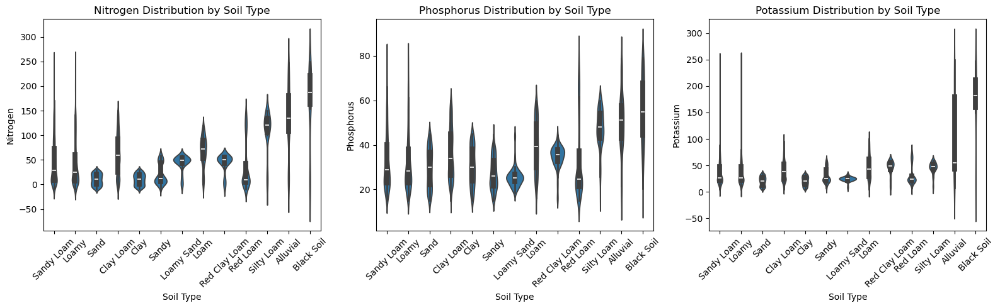

In [20]:
plt.figure(figsize=(16, 5))
for i, col in enumerate(['Nitrogen', 'Phosphorus', 'Potassium']):
    plt.subplot(1, 3, i+1)
    sns.violinplot(data=agri, x='Soil Type', y=col)
    plt.title(f'{col} Distribution by Soil Type')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

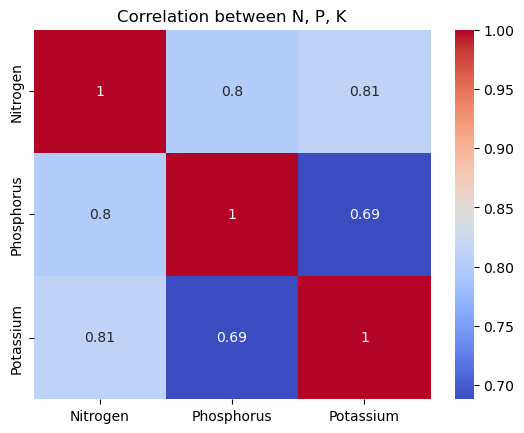

In [21]:
npk_df = agri[['Nitrogen', 'Phosphorus', 'Potassium']]
corr_matrix = npk_df.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation between N, P, K")
plt.show()

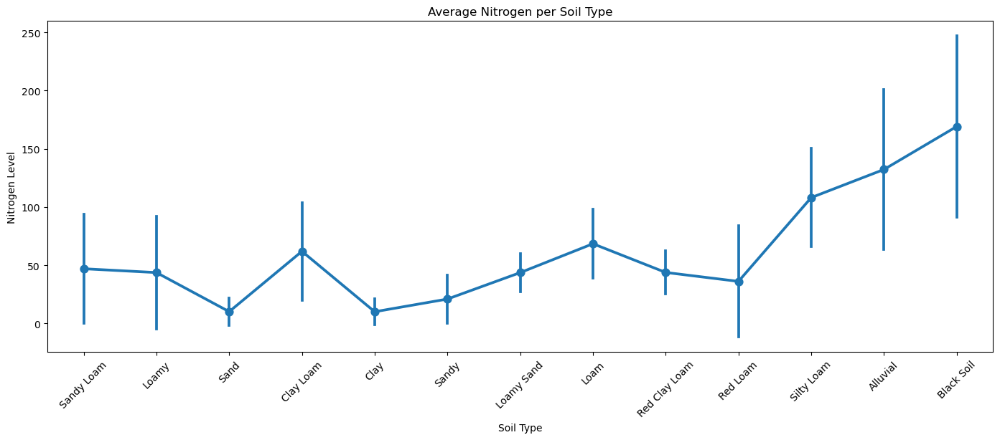

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(17, 6))
sns.pointplot(data=agri, x='Soil Type', y='Nitrogen', estimator='mean', ci='sd')
plt.title('Average Nitrogen per Soil Type')
plt.xticks(rotation=45)
plt.ylabel('Nitrogen Level')
plt.show()


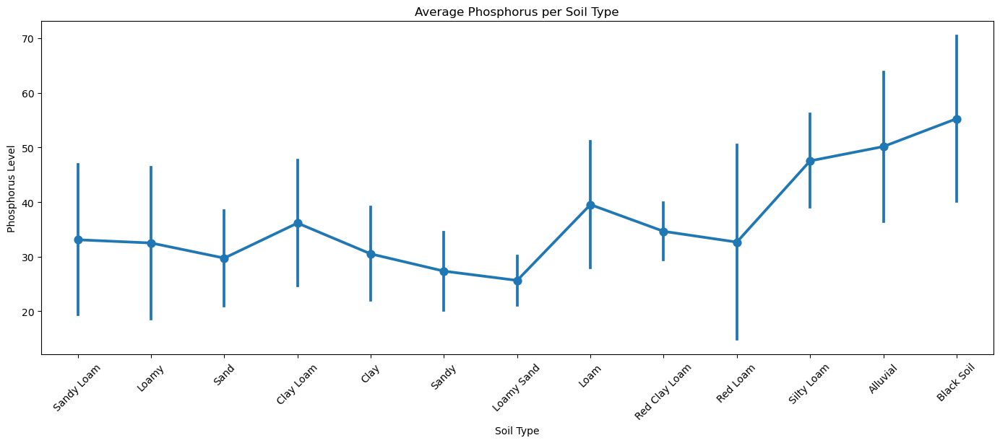

In [23]:
plt.figure(figsize=(17, 6))
sns.pointplot(data=agri, x='Soil Type', y='Phosphorus', estimator='mean', ci='sd')
plt.title('Average Phosphorus per Soil Type')
plt.xticks(rotation=45)
plt.ylabel('Phosphorus Level')
plt.show()


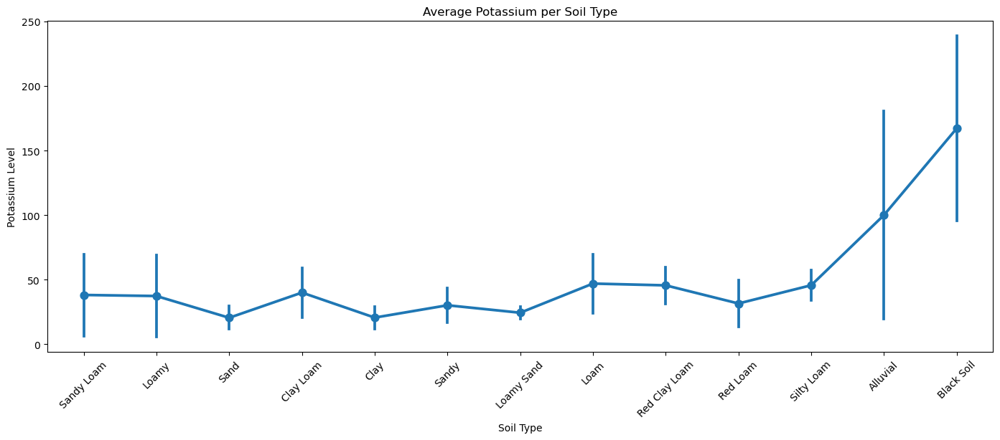

In [24]:
plt.figure(figsize=(17, 6))
sns.pointplot(data=agri, x='Soil Type', y='Potassium', estimator='mean', ci='sd')
plt.title('Average Potassium per Soil Type')
plt.xticks(rotation=45)
plt.ylabel('Potassium Level')
plt.show()


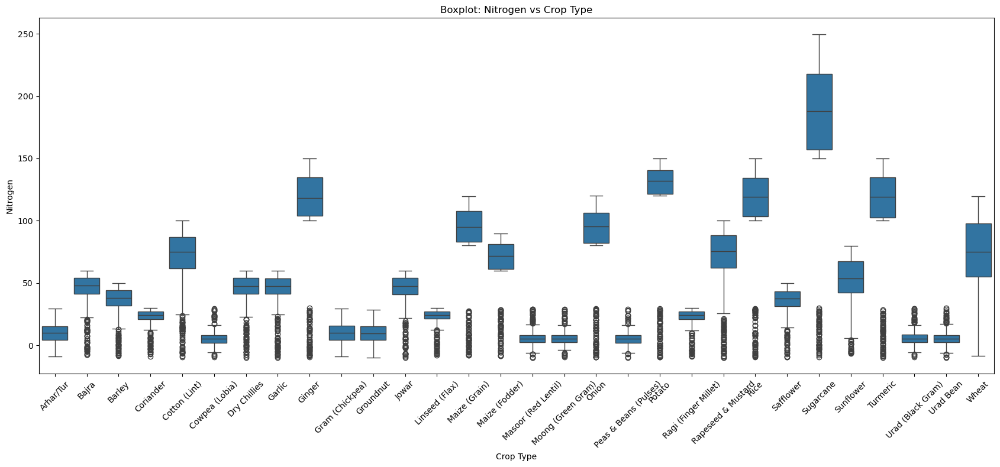

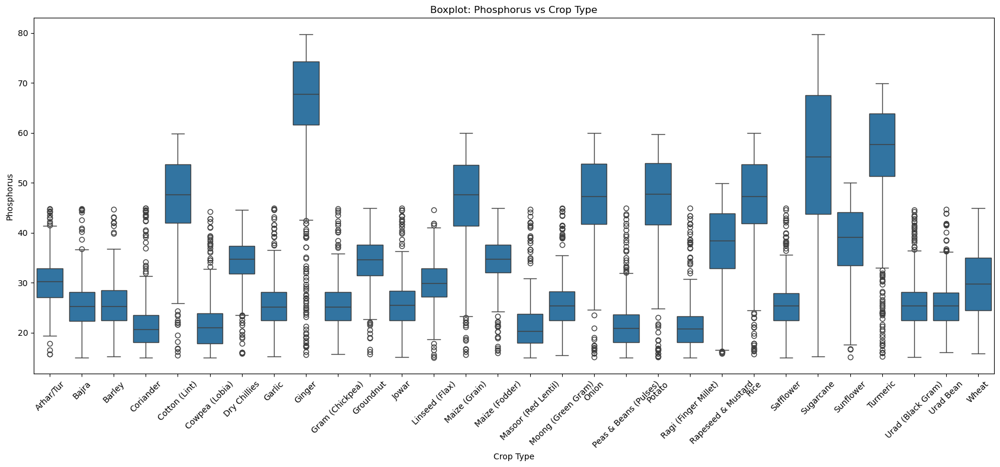

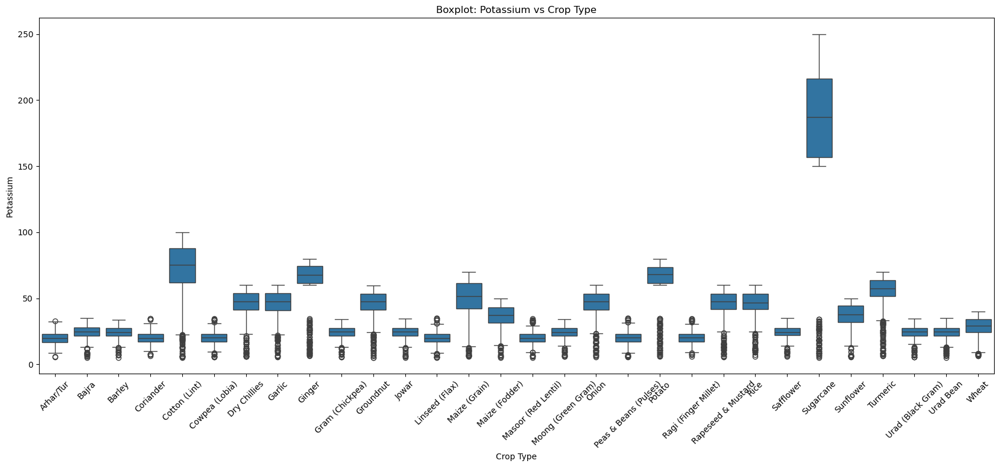

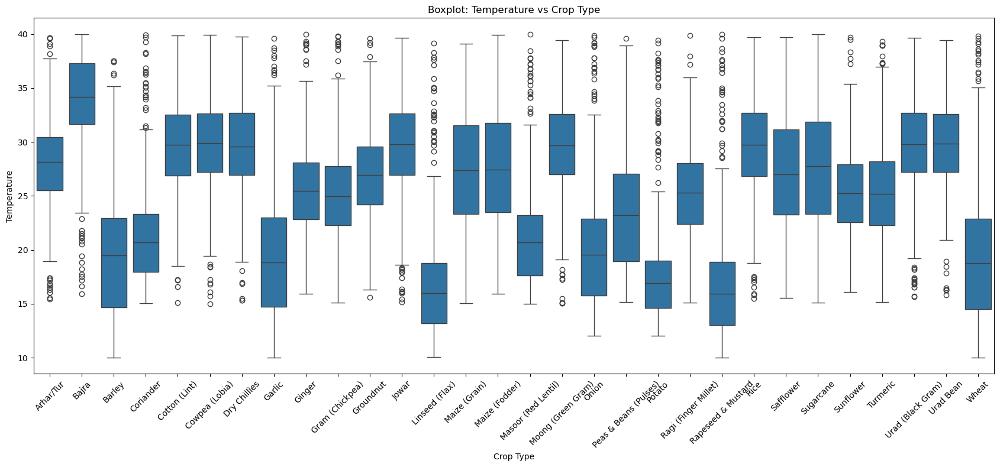

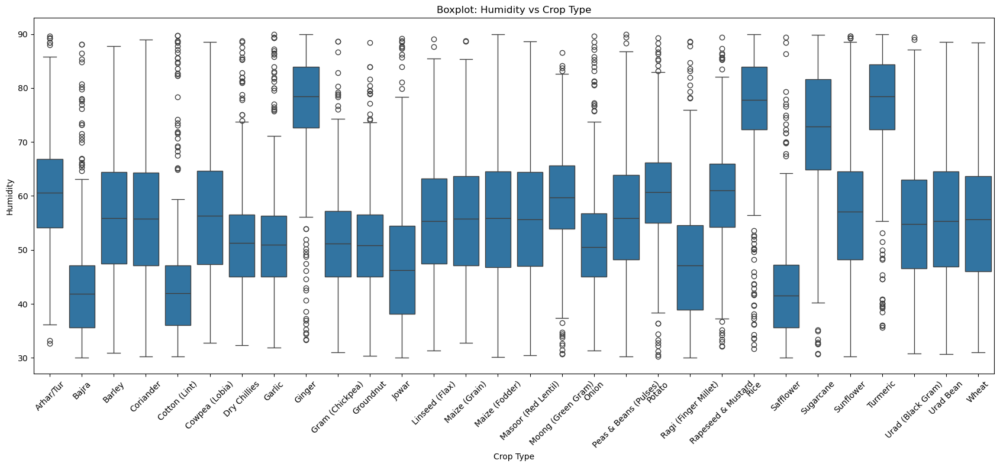

...

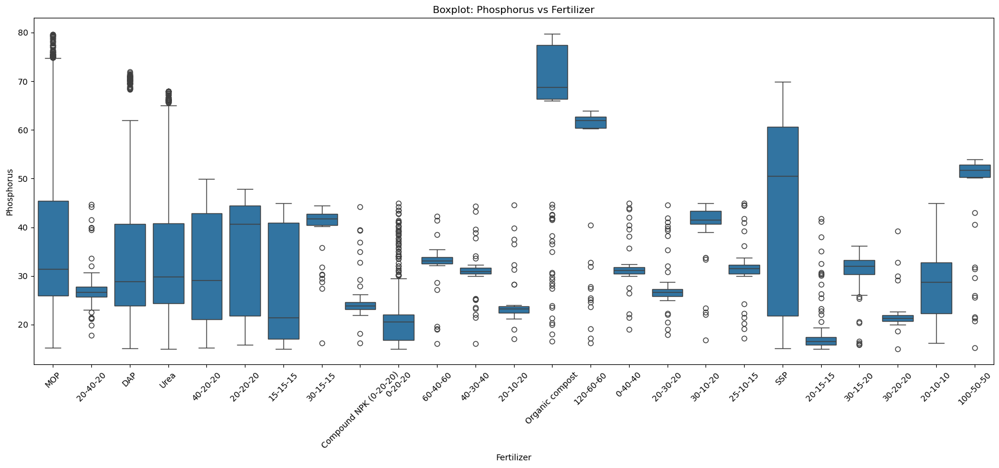

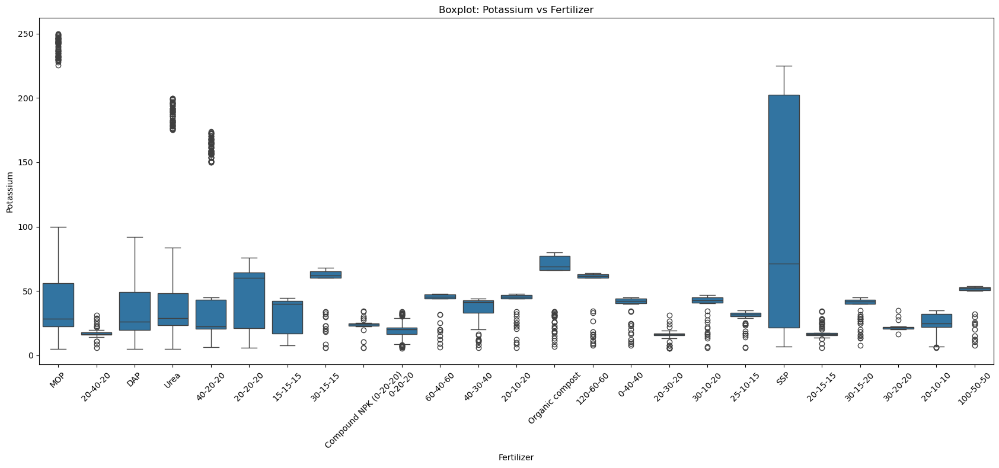

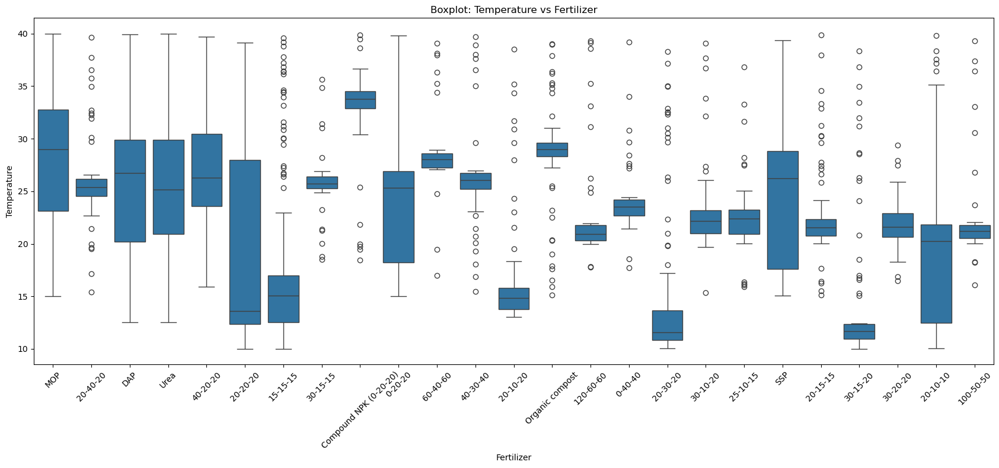

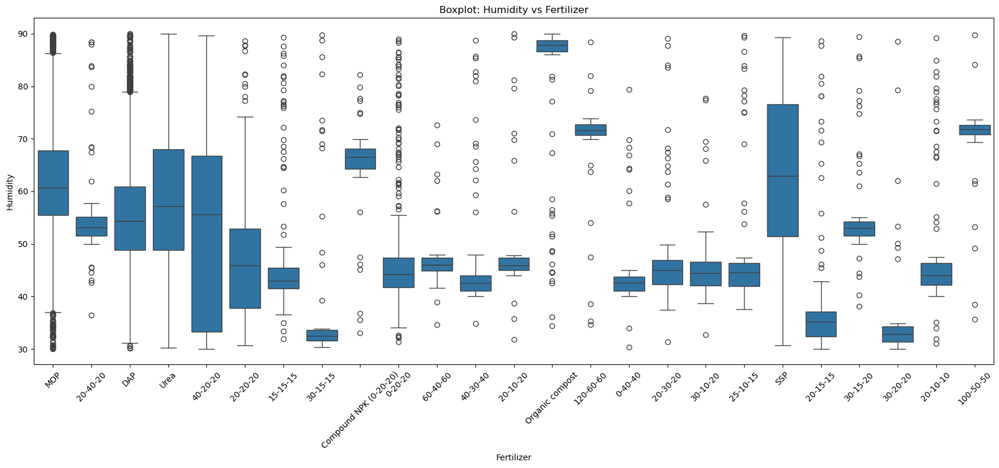

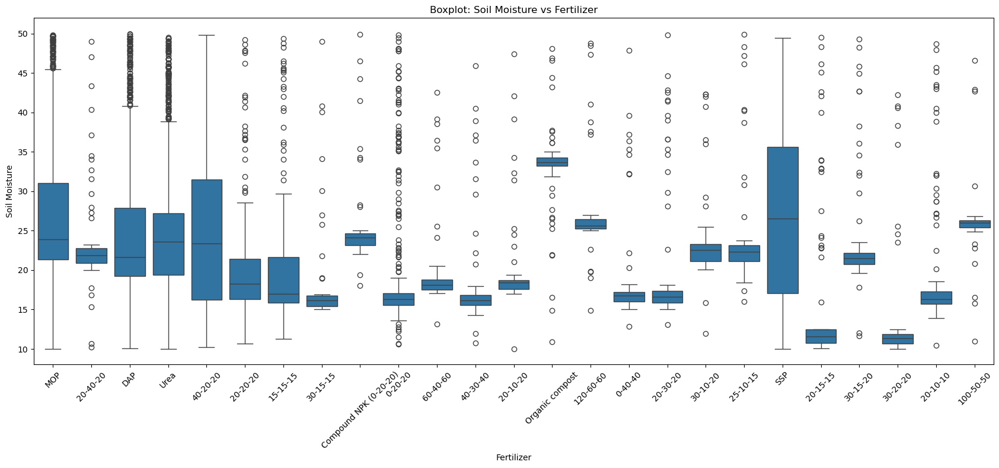

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

categorical_vars = ['Crop Type', 'Fertilizer']
continuous_vars = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'Soil Moisture']

for cat in categorical_vars:
    for cont in continuous_vars:
        plt.figure(figsize=(17, 8))
        sns.boxplot(data=agri, x=cat, y=cont)
        plt.title(f'Boxplot: {cont} vs {cat}')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()


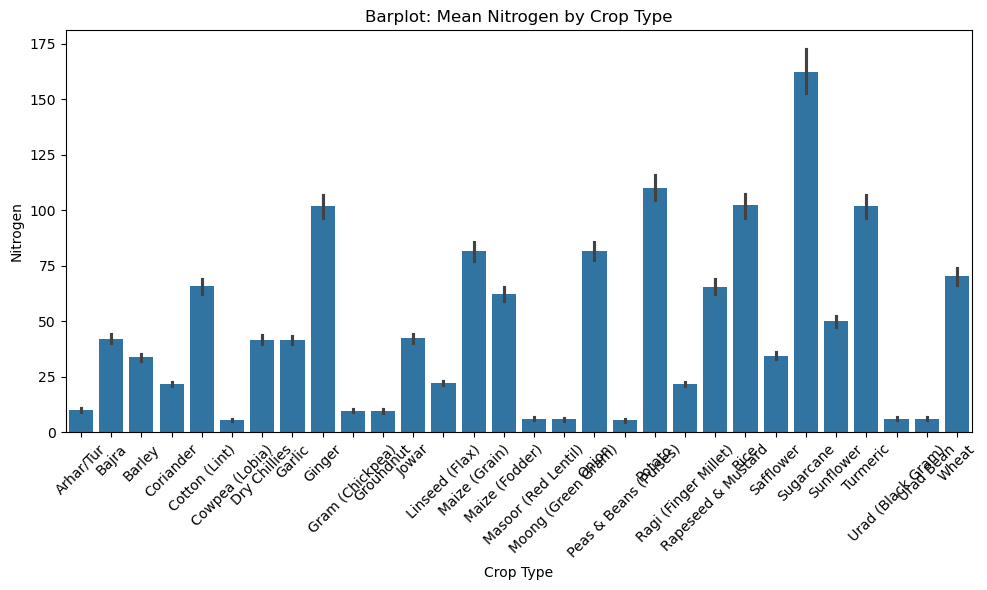

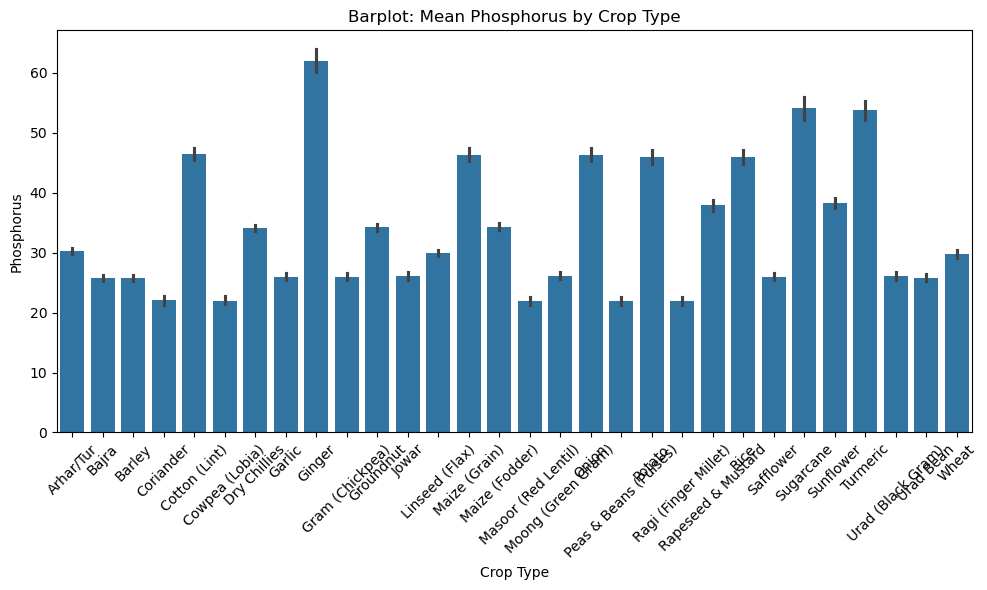

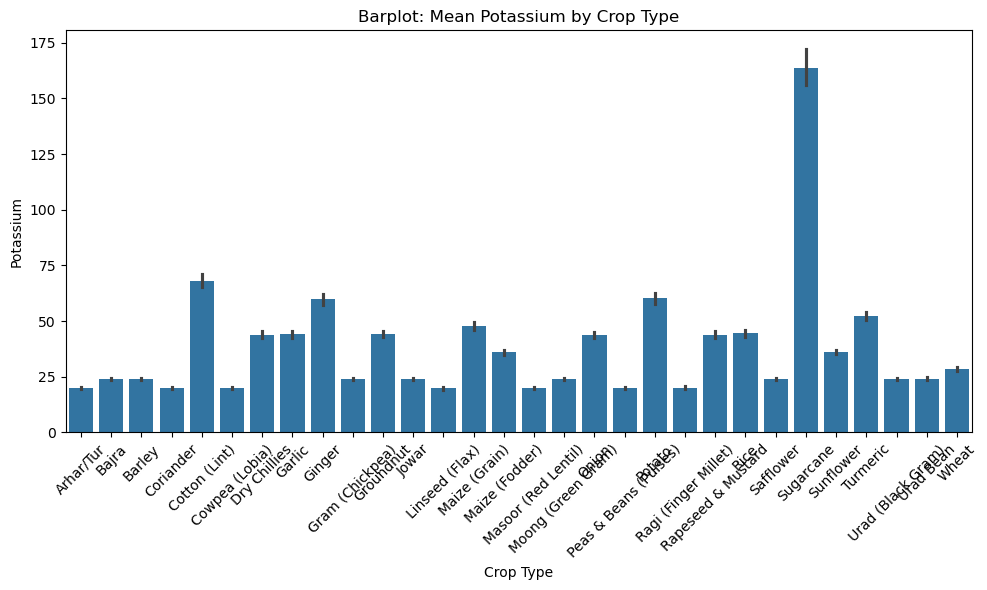

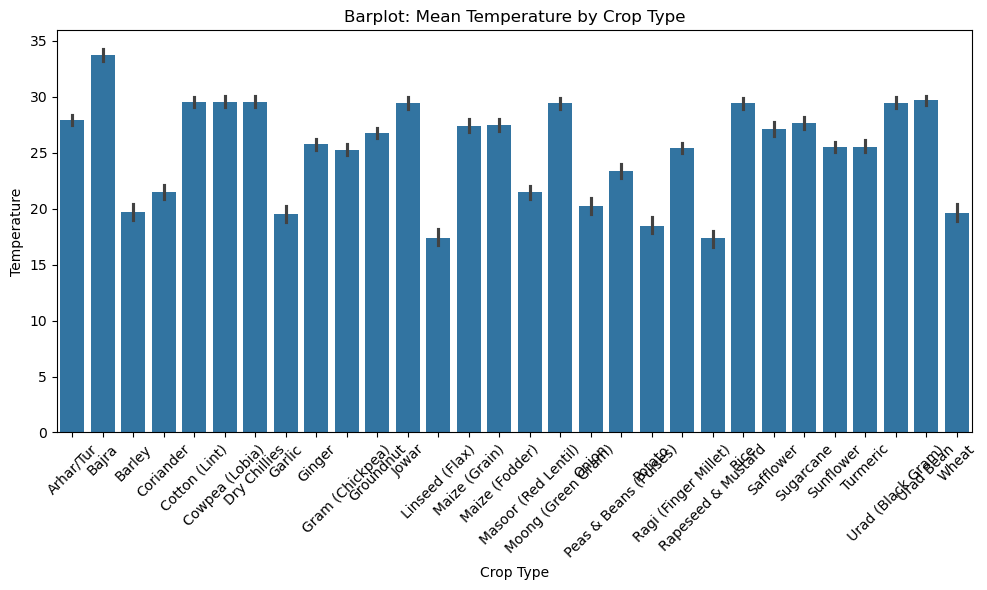

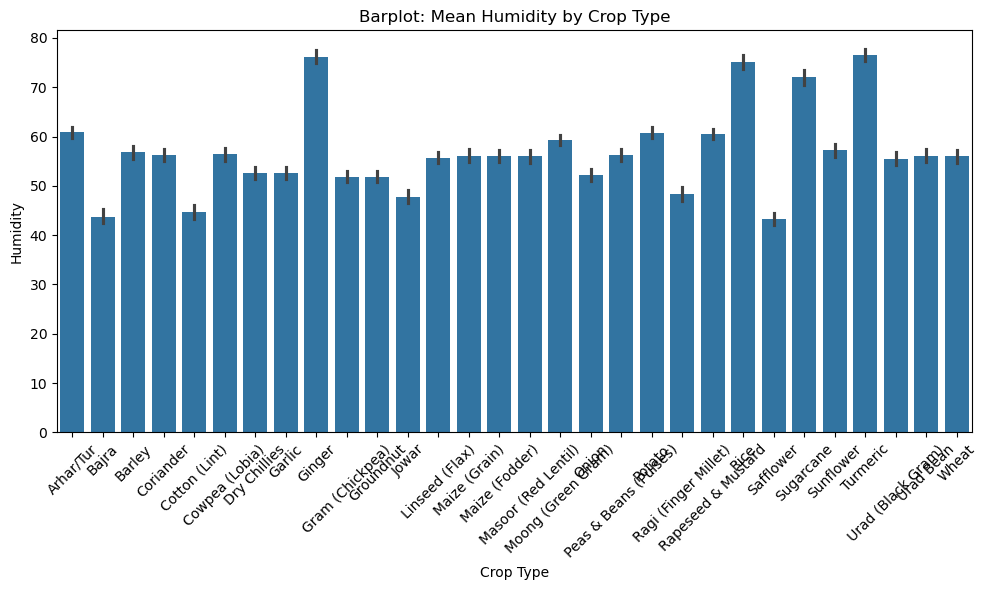

...

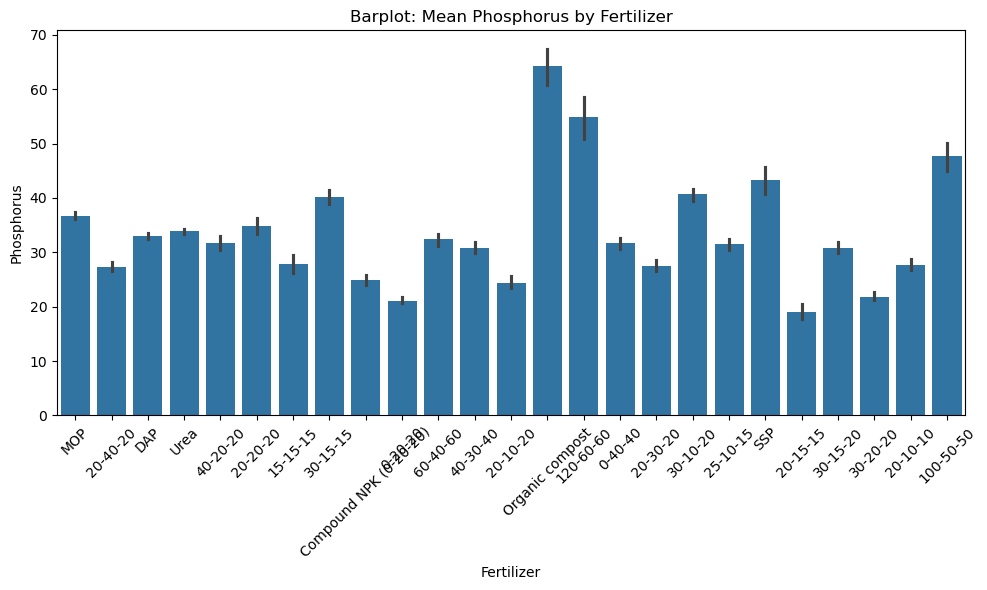

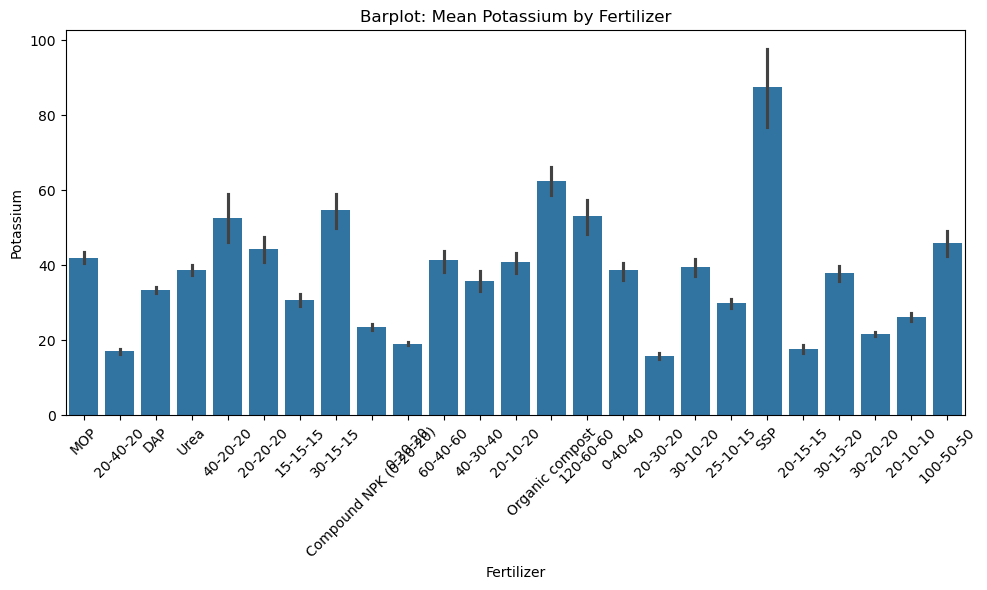

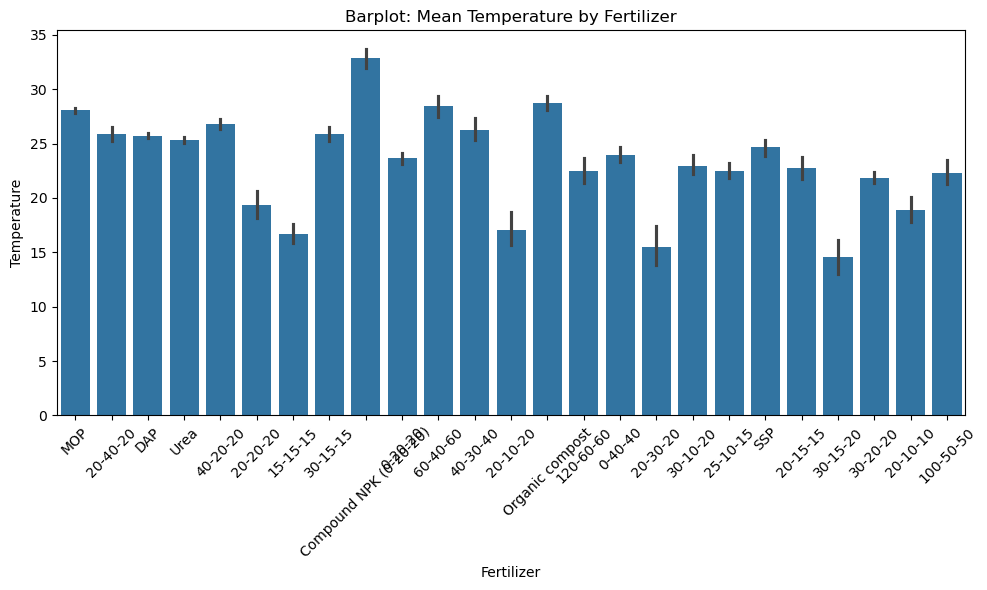

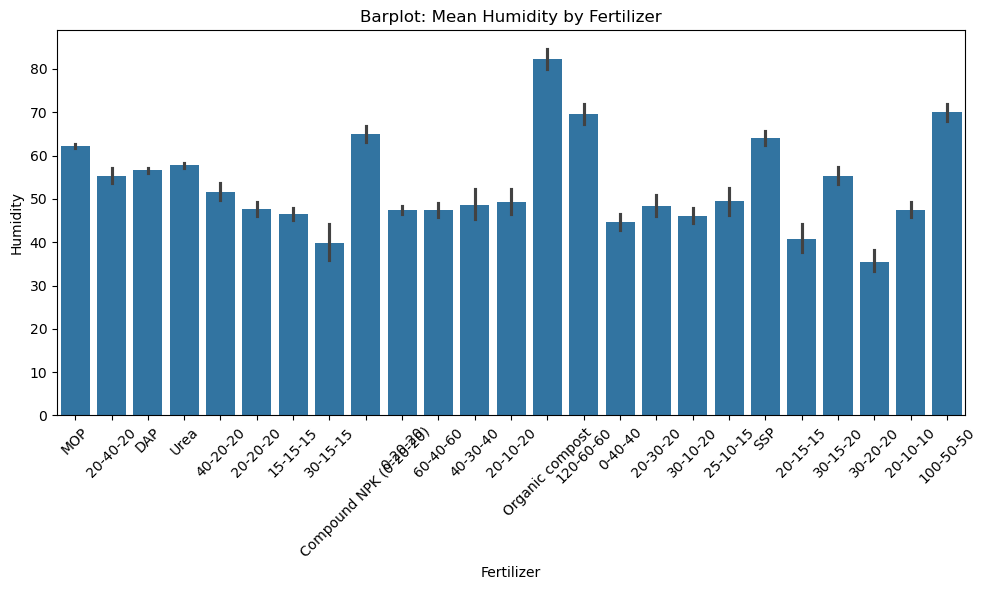

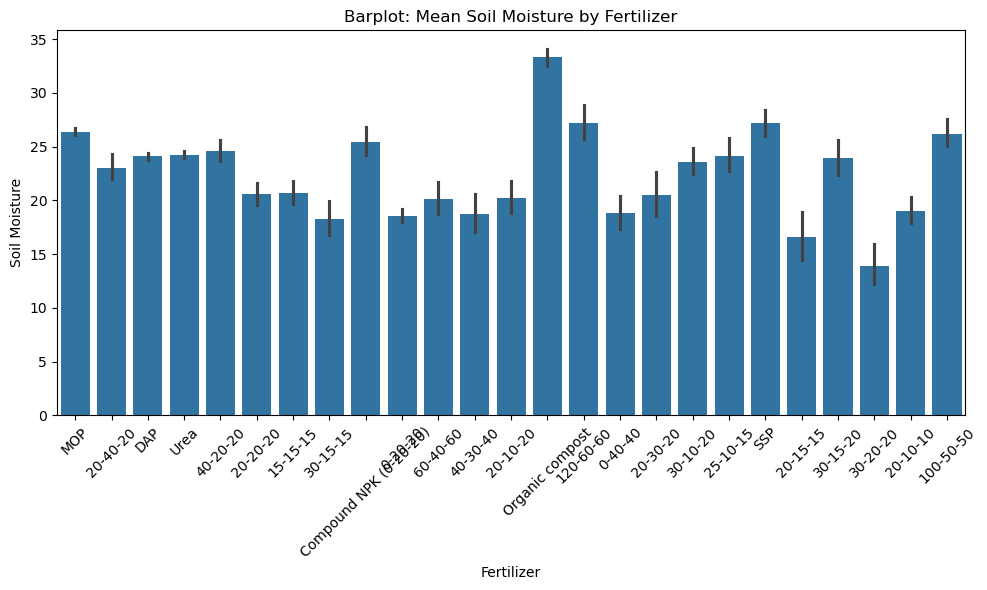

In [26]:
for cat in categorical_vars:
    for cont in continuous_vars:
        plt.figure(figsize=(10, 6))
        sns.barplot(data=agri, x=cat, y=cont)
        plt.title(f'Barplot: Mean {cont} by {cat}')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()


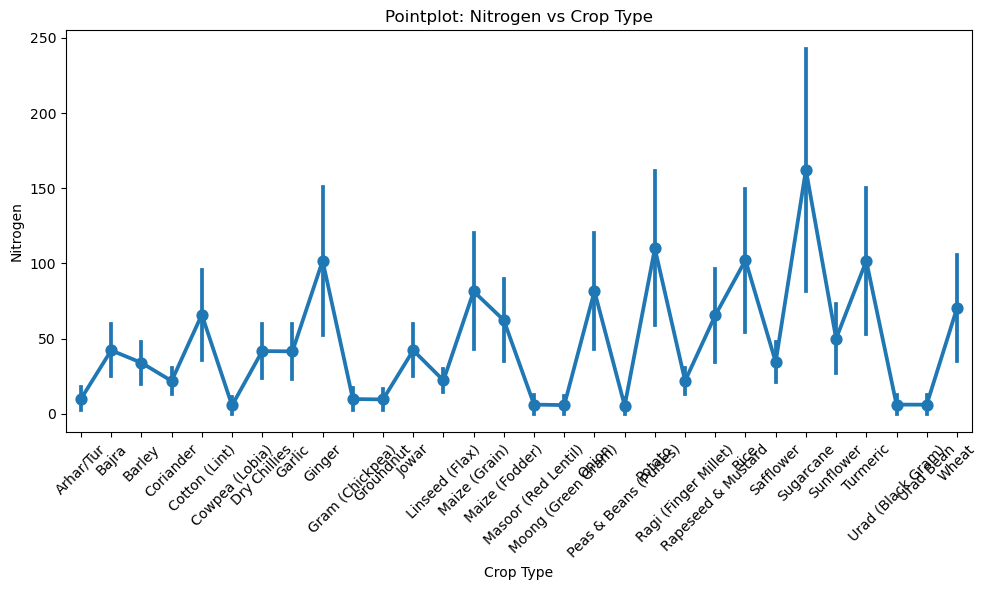

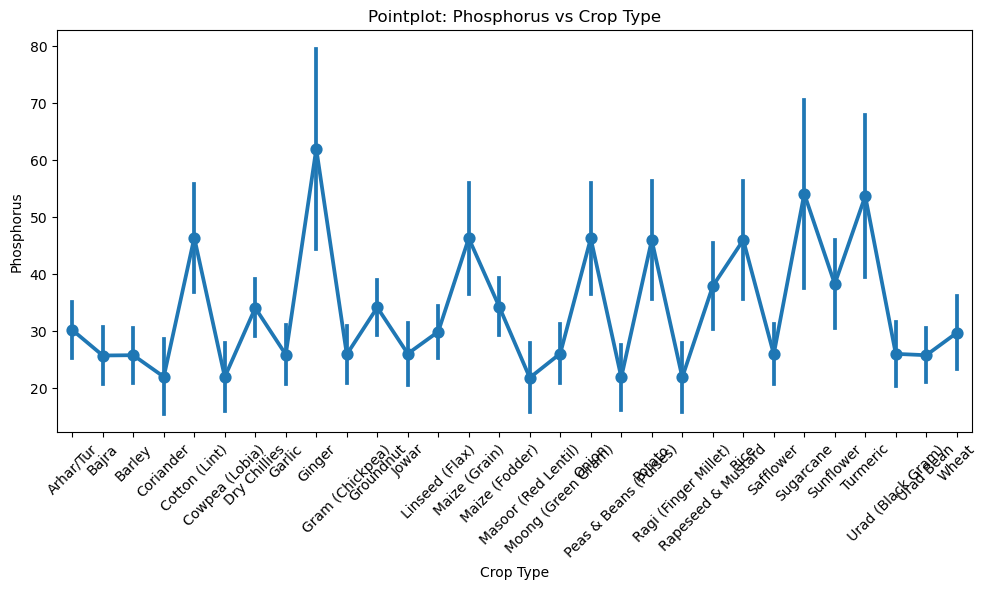

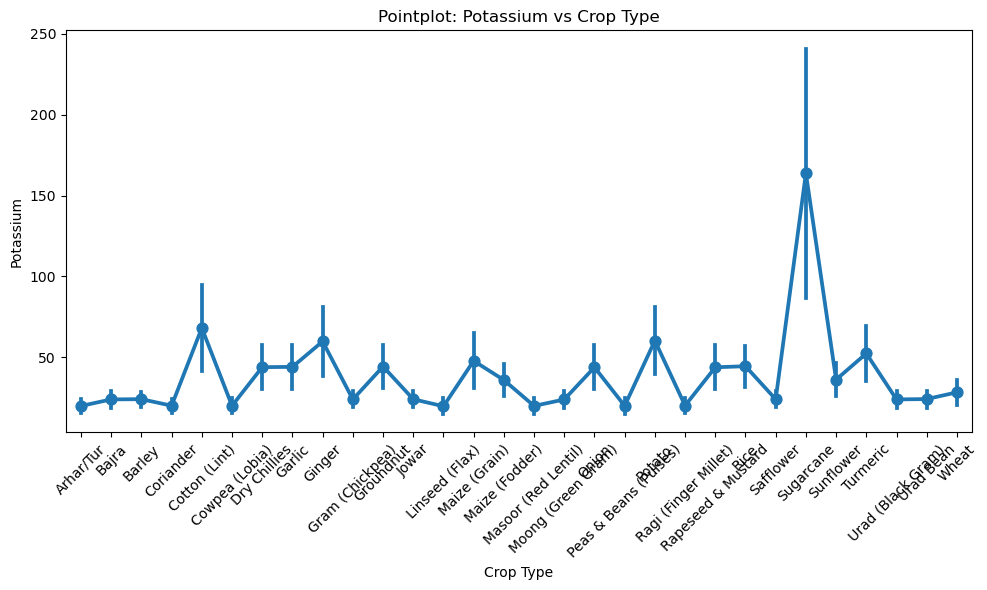

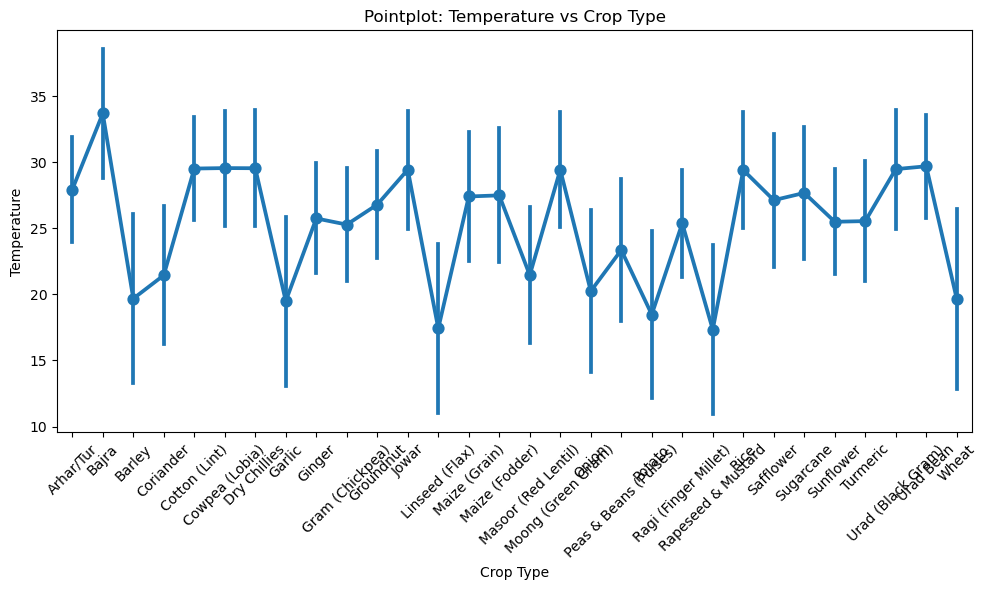

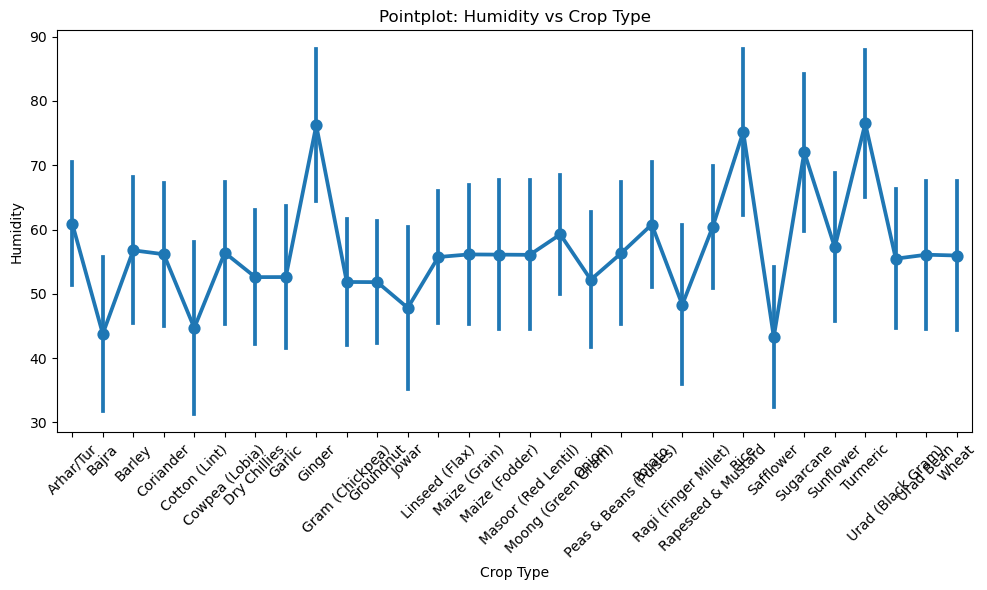

...

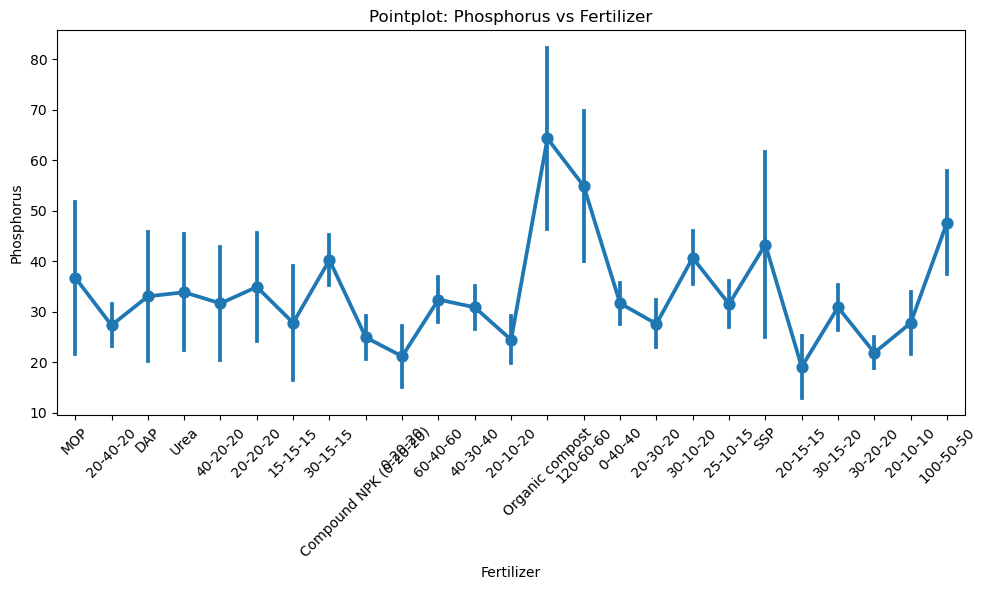

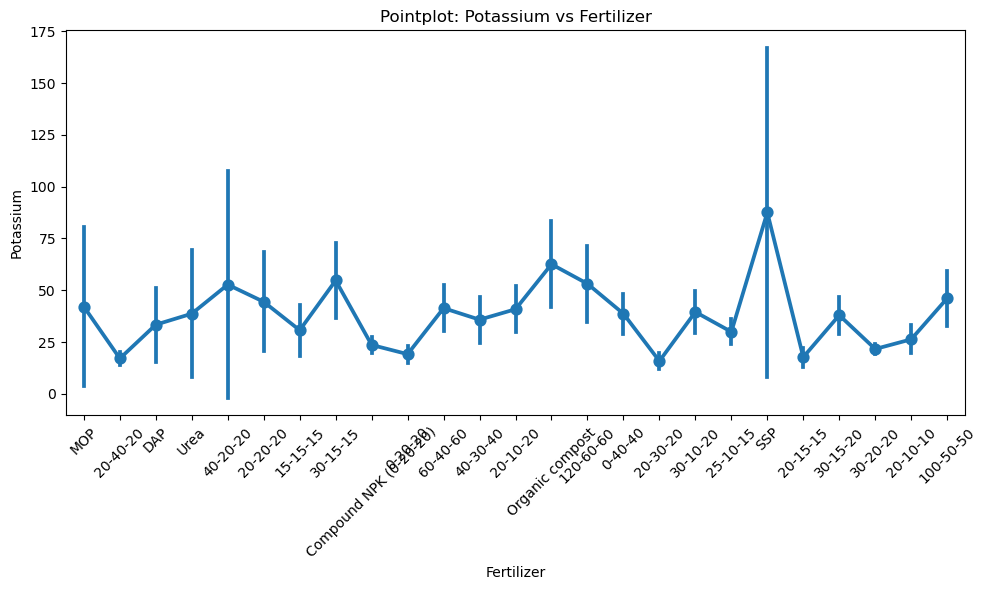

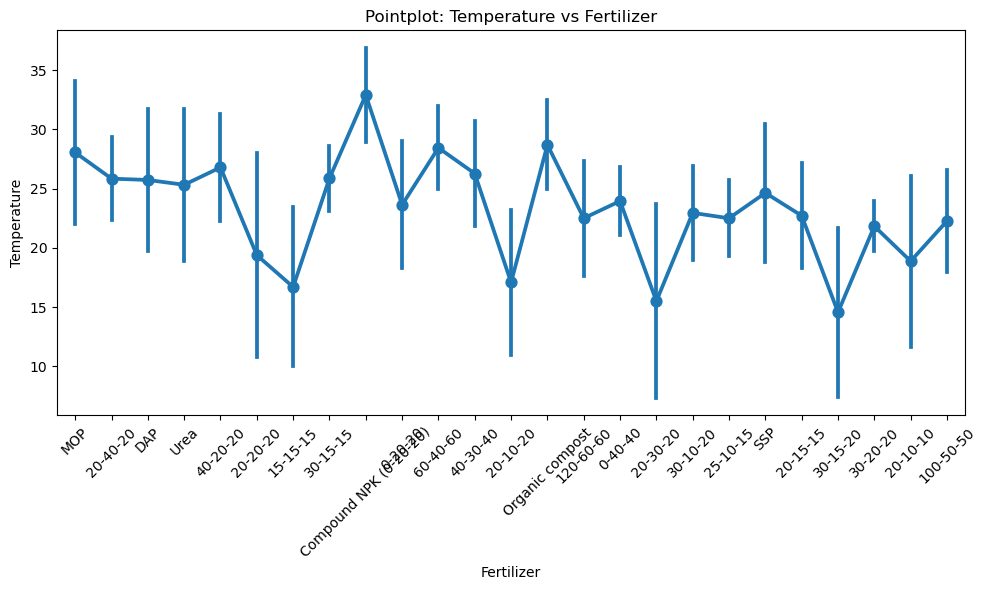

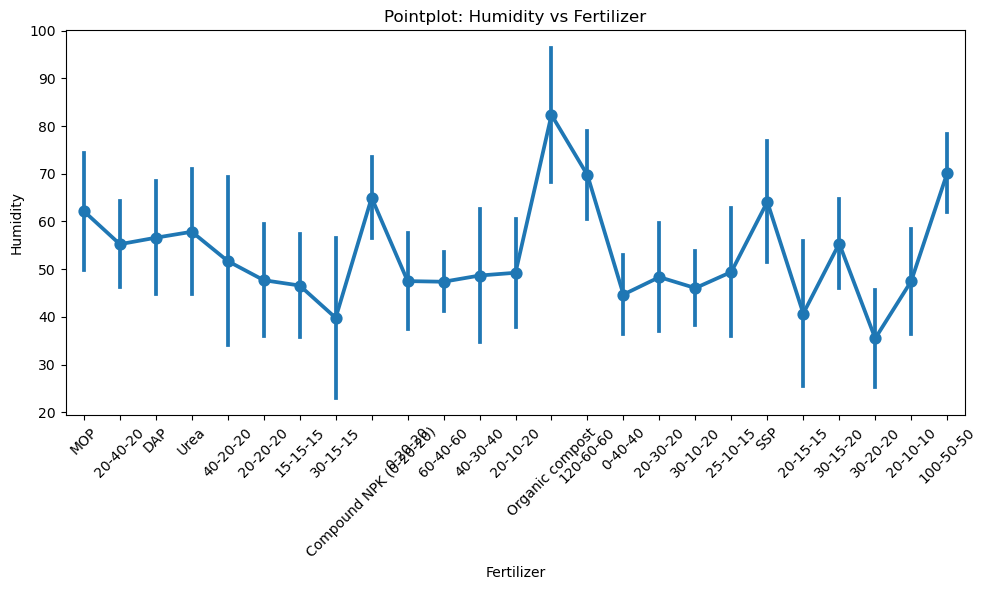

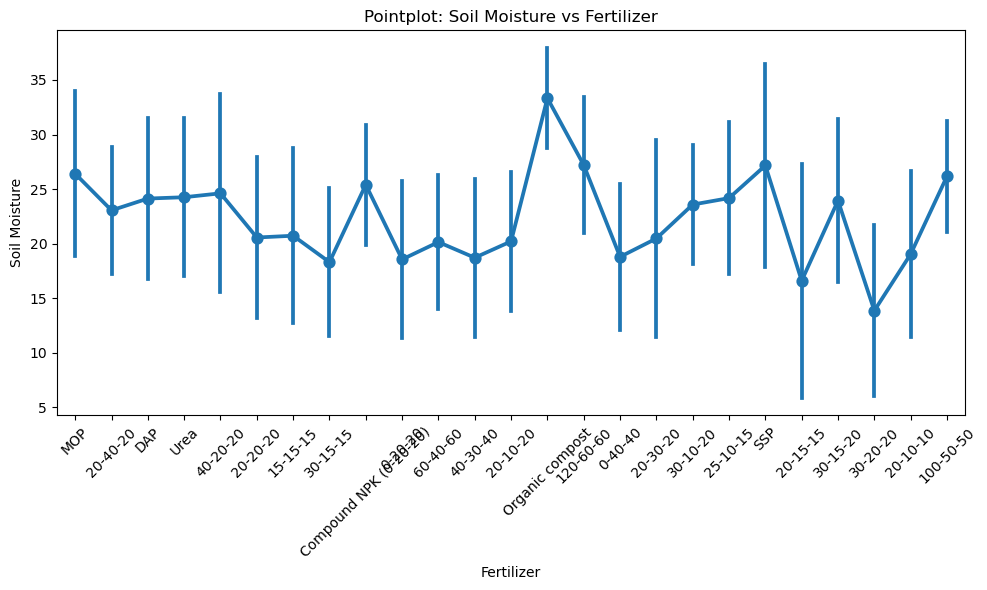

In [27]:
for cat in categorical_vars:
    for cont in continuous_vars:
        plt.figure(figsize=(10, 6))
        sns.pointplot(data=agri, x=cat, y=cont, estimator='mean', ci='sd')
        plt.title(f'Pointplot: {cont} vs {cat}')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()


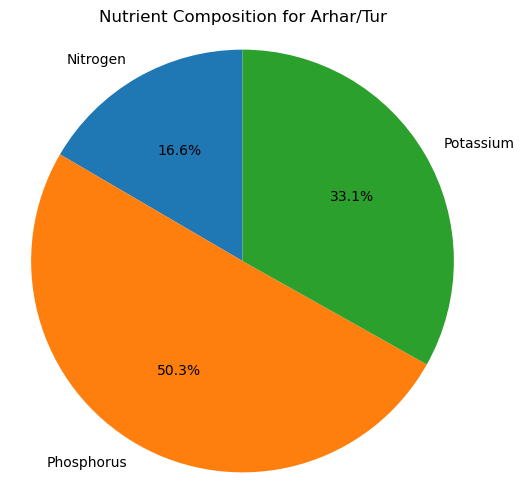

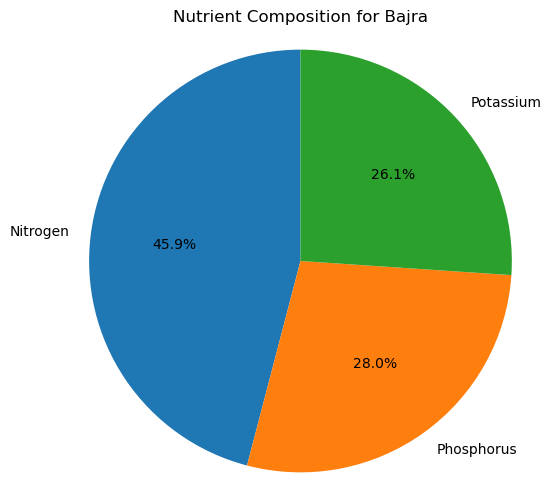

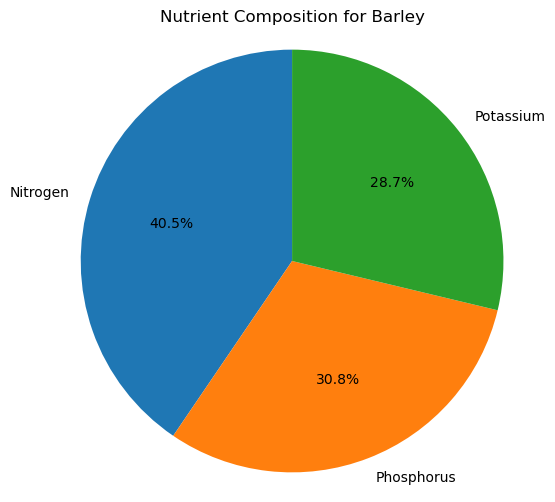

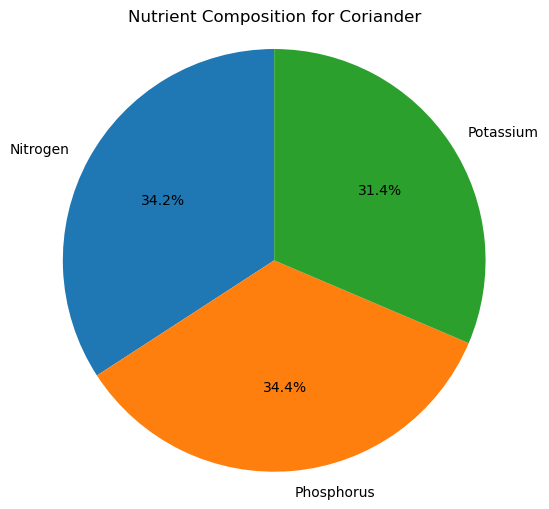

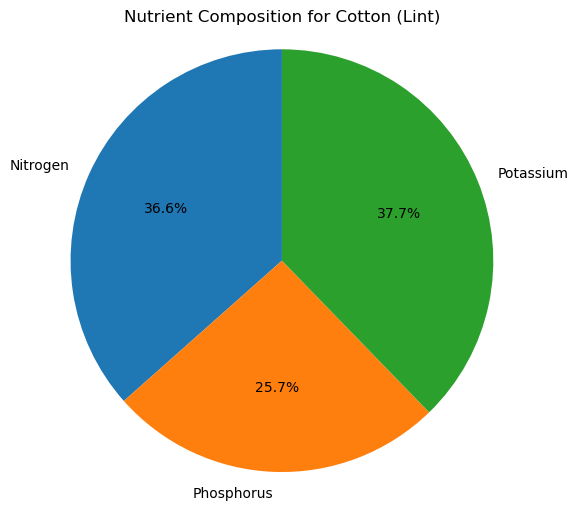

...

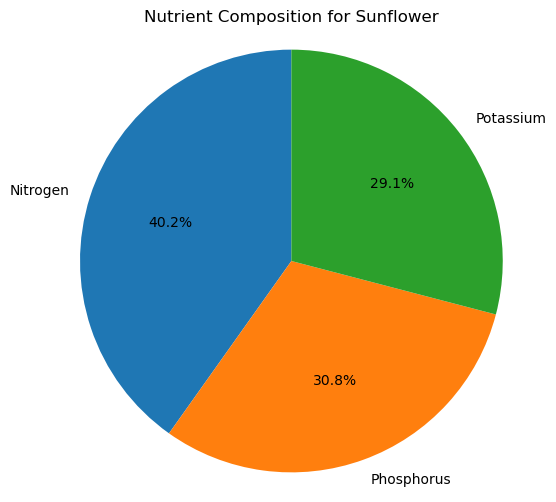

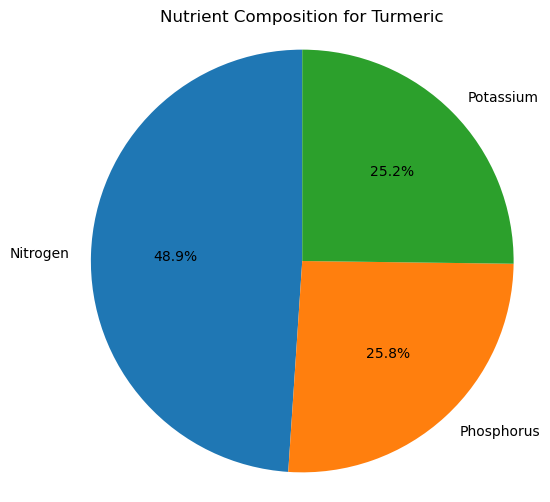

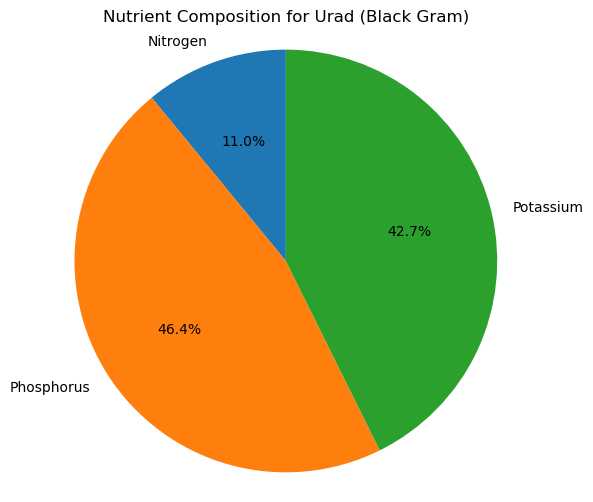

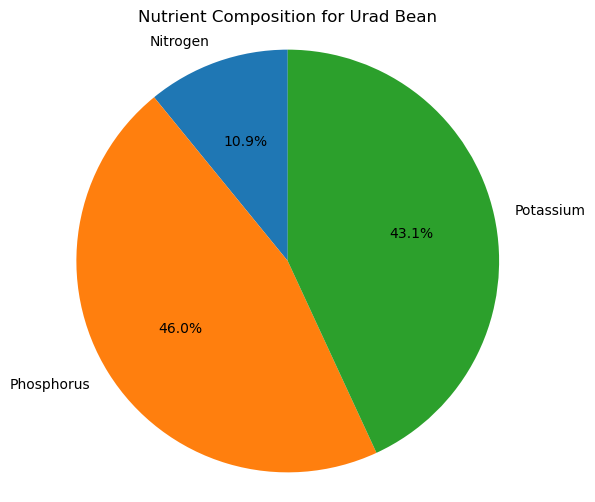

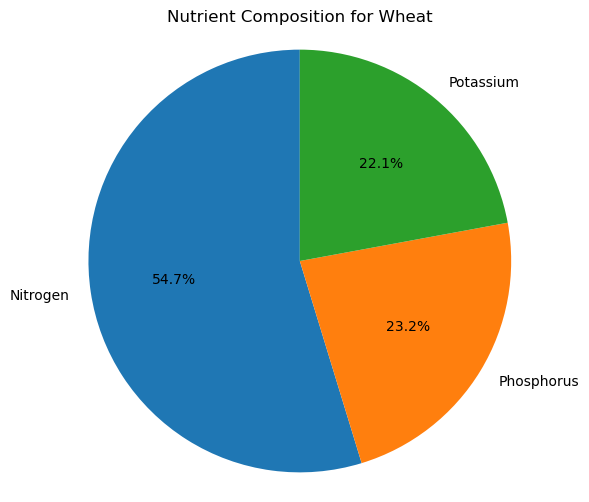

In [28]:
avg_nutrients = agri.groupby('Crop Type')[['Nitrogen', 'Phosphorus', 'Potassium']].mean()

for crop in avg_nutrients.index:
    values = avg_nutrients.loc[crop]
    plt.figure(figsize=(6, 6))
    plt.pie(values, labels=values.index, autopct='%1.1f%%', startangle=90)
    plt.title(f'Nutrient Composition for {crop}')
    plt.axis('equal')
    plt.show()


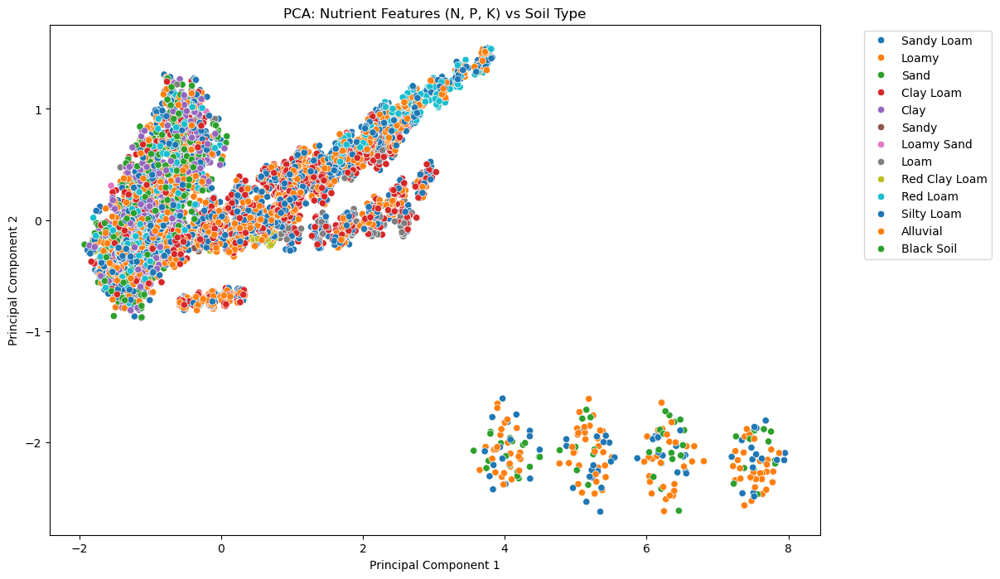

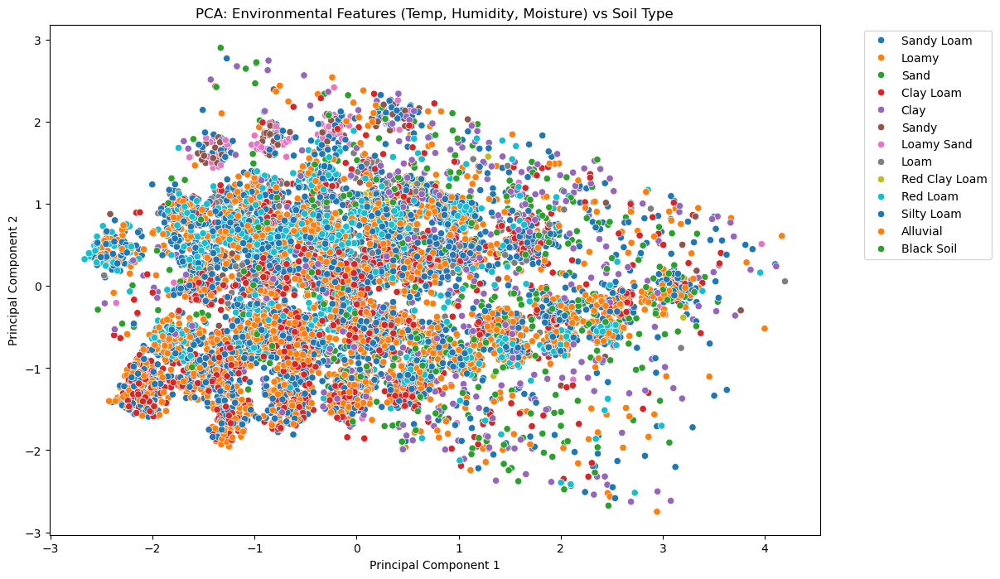

In [29]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
nutrient_features = ['Nitrogen', 'Phosphorus', 'Potassium']
X_nutrients = agri[nutrient_features]

# Scale the data
scaler = StandardScaler()
X_nutrients_scaled = scaler.fit_transform(X_nutrients)

# PCA
pca_nutrients = PCA(n_components=2)
nutrients_pca = pca_nutrients.fit_transform(X_nutrients_scaled)

# DataFrame with Soil Type
nutrient_df = pd.DataFrame(nutrients_pca, columns=['PC1', 'PC2'])
nutrient_df['Soil Type'] = agri['Soil Type']

# Plot
plt.figure(figsize=(12, 8))
sns.scatterplot(data=nutrient_df, x='PC1', y='PC2', hue='Soil Type', palette='tab10')
plt.title('PCA: Nutrient Features (N, P, K) vs Soil Type')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


# ----------------------------
# Environmental Features PCA
# ----------------------------
env_features = ['Temperature', 'Humidity', 'Soil Moisture']
X_env = agri[env_features]

# Scale the data
X_env_scaled = scaler.fit_transform(X_env)

# PCA
pca_env = PCA(n_components=2)
env_pca = pca_env.fit_transform(X_env_scaled)

# DataFrame with Soil Type
env_df = pd.DataFrame(env_pca, columns=['PC1', 'PC2'])
env_df['Soil Type'] = agri['Soil Type']

# Plot
plt.figure(figsize=(12, 8))
sns.scatterplot(data=env_df, x='PC1', y='PC2', hue='Soil Type', palette='tab10')
plt.title('PCA: Environmental Features (Temp, Humidity, Moisture) vs Soil Type')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [30]:
import matplotlib.pyplot as plt

def plot_nutrient_proportion(data, category_col):
    unique_categories = data[category_col].dropna().unique()
    for cat in unique_categories:
        subset = data[data[category_col] == cat]
        mean_N = subset['Nitrogen'].mean()
        mean_P = subset['Phosphorus'].mean()
        mean_K = subset['Potassium'].mean()
        
        total = mean_N + mean_P + mean_K
        if total == 0:
            continue  # skip empty or zero rows
        proportions = [mean_N / total, mean_P / total, mean_K / total]
        labels = ['Nitrogen (N)', 'Phosphorus (P)', 'Potassium (K)']
        
        plt.figure(figsize=(5, 5))
        plt.pie(proportions, labels=labels, autopct='%1.1f%%', startangle=140)
        plt.title(f'Nutrient Proportion - {category_col}: {cat}')
        plt.tight_layout()
        plt.show()


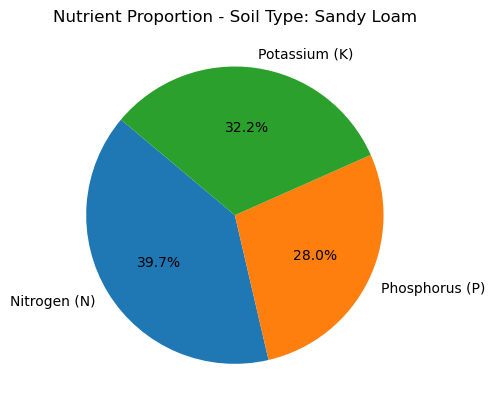

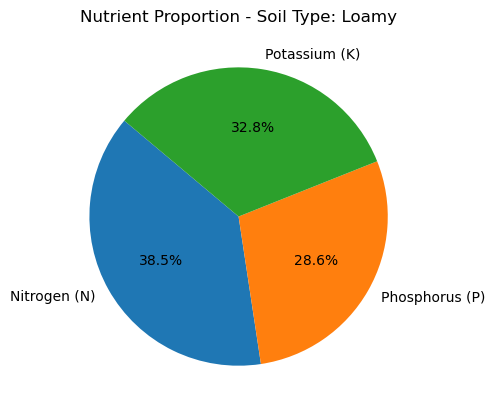

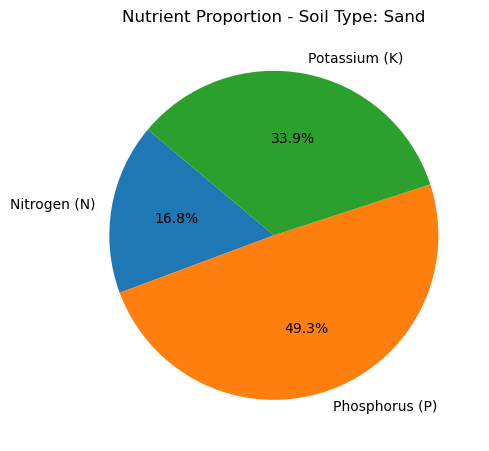

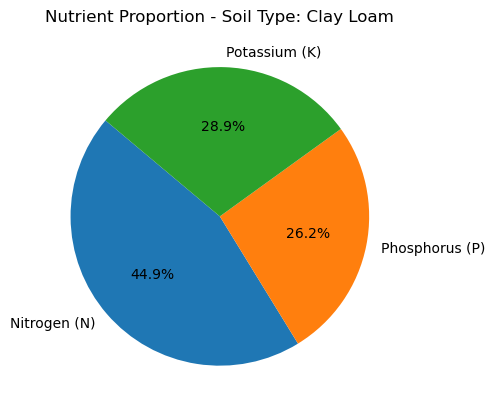

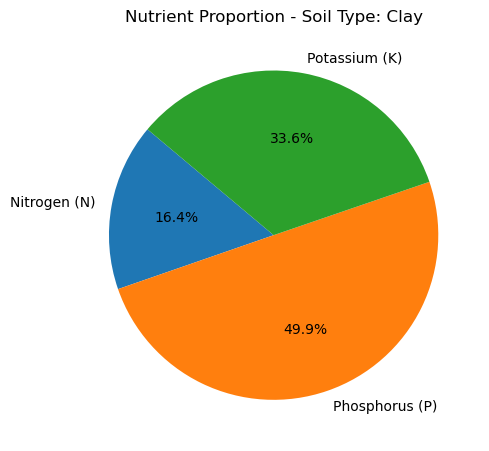

...

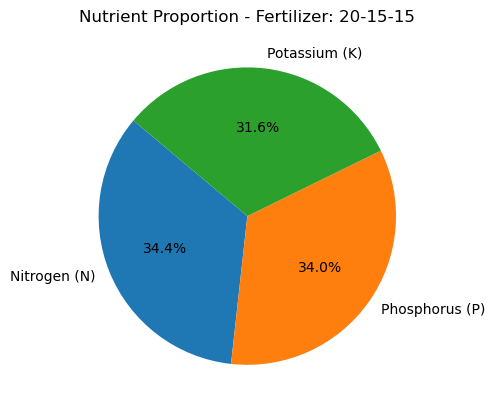

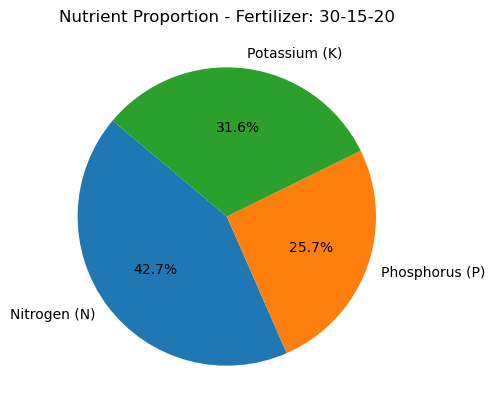

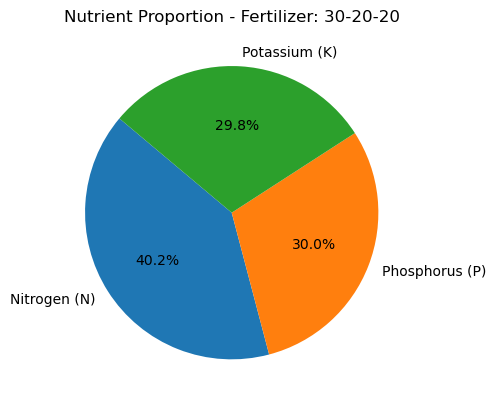

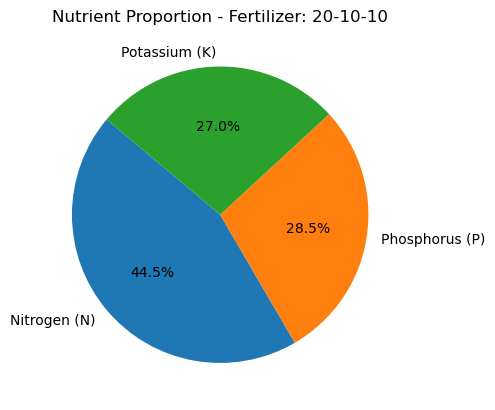

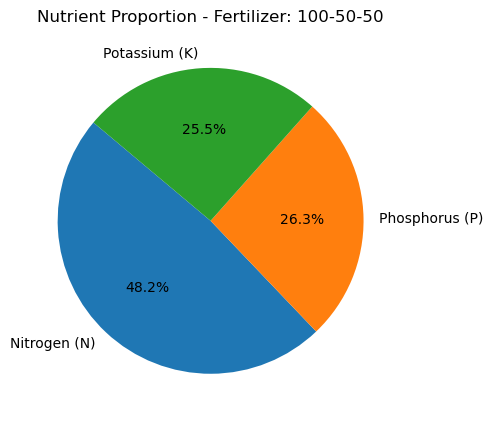

In [31]:
# For Soil Type
plot_nutrient_proportion(agri, 'Soil Type')

# For Fertilizer Name
plot_nutrient_proportion(agri, 'Fertilizer')


In [64]:
# Load your dataset if not already loaded
# agri = pd.read_csv("agri_dataset.csv")

# Group by Crop Type to avoid duplicates and compute mean N, P, K
crop_means = agri.groupby('Crop Type')[['Nitrogen', 'Phosphorus', 'Potassium']].mean()

# Top and bottom 5 crops by each nutrient
top_nitrogen = crop_means.sort_values('Nitrogen', ascending=False).head(5).index.tolist()
top_phosphorus = crop_means.sort_values('Phosphorus', ascending=False).head(5).index.tolist()
top_potassium = crop_means.sort_values('Potassium', ascending=False).head(5).index.tolist()

low_nitrogen = crop_means.sort_values('Nitrogen', ascending=True).head(5).index.tolist()
low_phosphorus = crop_means.sort_values('Phosphorus', ascending=True).head(5).index.tolist()

# Evenly spread crops: lowest standard deviation among N, P, K
crop_means['NPK_std'] = crop_means.std(axis=1)
even_spread = crop_means.sort_values('NPK_std').head(5).index.tolist()

# Create summary table
summary_table = pd.DataFrame({
    'Max Nitrogen': top_nitrogen,
    'Max Phosphorus': top_phosphorus,
    'Max Potassium': top_potassium,
    'Min Nitrogen': low_nitrogen,
    'Min Phosphorus': low_phosphorus,
    'Evenly Spread Nutrients': even_spread
})

# Reset index for clean table display
summary_table.reset_index(drop=True, inplace=True)

# Display the table
print(summary_table)

  Max Nitrogen Max Phosphorus  Max Potassium           Min Nitrogen  \
0    Sugarcane         Ginger      Sugarcane  Peas & Beans (Pulses)   
1       Potato      Sugarcane  Cotton (Lint)         Cowpea (Lobia)   
2         Rice       Turmeric         Potato     Moong (Green Gram)   
3       Ginger  Cotton (Lint)         Ginger              Urad Bean   
4     Turmeric  Maize (Grain)       Turmeric      Urad (Black Gram)   

          Min Phosphorus Evenly Spread Nutrients  
0    Masoor (Red Lentil)    Ragi (Finger Millet)  
1  Peas & Beans (Pulses)               Coriander  
2   Ragi (Finger Millet)            Dry Chillies  
3         Cowpea (Lobia)                  Barley  
4              Coriander          Linseed (Flax)  
